In [357]:
import os
import pandas as pd

In [358]:
df = pd.read_csv('fer2013.csv')

In [359]:
df.head()

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


In [361]:
# Images' pixels are stored as strings (listing all the pixel values), so we need to parse
# and transform them into lists of floats
import numpy as np
img_pixels =  [np.asarray(x, dtype=float) for x in df.pixels.str.split(' ').tolist()]

In [362]:
img_pixels[:10]

[array([ 70.,  80.,  82., ..., 106., 109.,  82.]),
 array([151., 150., 147., ..., 193., 183., 184.]),
 array([231., 212., 156., ...,  88., 110., 152.]),
 array([ 24.,  32.,  36., ..., 142., 143., 142.]),
 array([ 4.,  0.,  0., ..., 30., 29., 30.]),
 array([55., 55., 55., ..., 34., 30., 57.]),
 array([ 20.,  17.,  19., ...,  99., 107., 118.]),
 array([ 77.,  78.,  79., ..., 125.,  67.,  68.]),
 array([85., 84., 90., ..., 58., 73., 84.]),
 array([255., 254., 255., ..., 254., 255., 255.])]

In [363]:
# encoding emotion numbers to one-hot fashion

def value_to_onehot(x):
    return np.eye(7, dtype=float)[x]

emotions_onehot = [value_to_onehot(x) for x in df.emotion]
emotions_onehot[:10]

[array([1., 0., 0., 0., 0., 0., 0.]),
 array([1., 0., 0., 0., 0., 0., 0.]),
 array([0., 0., 1., 0., 0., 0., 0.]),
 array([0., 0., 0., 0., 1., 0., 0.]),
 array([0., 0., 0., 0., 0., 0., 1.]),
 array([0., 0., 1., 0., 0., 0., 0.]),
 array([0., 0., 0., 0., 1., 0., 0.]),
 array([0., 0., 0., 1., 0., 0., 0.]),
 array([0., 0., 0., 1., 0., 0., 0.]),
 array([0., 0., 1., 0., 0., 0., 0.])]

In [364]:
emotions = ['anger', 'disgust', 'fear', 'happiness', 'sadness', 'surprise', 'neutral']
emotion_names = [emotions[x] for x in df.emotion]

In [365]:
emotions

['anger', 'disgust', 'fear', 'happiness', 'sadness', 'surprise', 'neutral']

In [366]:
d = {'usage': df.Usage.values, 'image': img_pixels, 'emotion_idx': df.emotion, 'emotion_onehot': emotions_onehot, 'emotion_name': emotion_names}
df2 = pd.DataFrame(data=d) #new dataframe
df2.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,Training,"[70.0, 80.0, 82.0, 72.0, 58.0, 58.0, 60.0, 63....",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,Training,"[151.0, 150.0, 147.0, 155.0, 148.0, 133.0, 111...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
2,Training,"[231.0, 212.0, 156.0, 164.0, 174.0, 138.0, 161...",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear
3,Training,"[24.0, 32.0, 36.0, 30.0, 32.0, 23.0, 19.0, 20....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,Training,"[4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


In [367]:
import plotly.express as px

In [368]:
px.pie(df2.groupby("usage").size().reset_index(), names="usage", values=0, title="Number of samples per dataset")

In [369]:
px.bar(df2.groupby(["emotion_name", "usage"]).size().reset_index(), x="emotion_name", y=0, color="usage" ,title="Class distribution of samples")

In [370]:
# Check if there are some empty (black) images in the dataset

black = df2.image.apply(np.max) == 0
df2[black]

,usage,image,emotion_idx,emotion_onehot,emotion_name
6458,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
7629,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]",happiness
10423,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
11286,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13148,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13402,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13988,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]",surprise
15894,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
22198,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
22927,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


In [371]:
# Proceed to exclude black images from the dataset

df3 = df2[np.logical_not(black)]
df3.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,Training,"[70.0, 80.0, 82.0, 72.0, 58.0, 58.0, 60.0, 63....",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,Training,"[151.0, 150.0, 147.0, 155.0, 148.0, 133.0, 111...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
2,Training,"[231.0, 212.0, 156.0, 164.0, 174.0, 138.0, 161...",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear
3,Training,"[24.0, 32.0, 36.0, 30.0, 32.0, 23.0, 19.0, 20....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,Training,"[4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


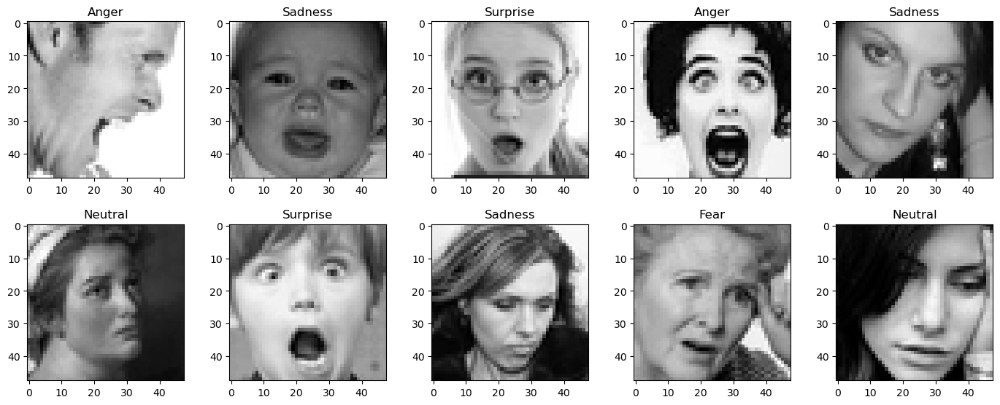

In [372]:
import matplotlib.pyplot as plt

row, col = 2, 5
img_size = 14 # Size of each picture in the plot
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

# Print row*col random images
for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        k = np.random.randint(len(df3.image)) # Pick a random image in the dataset
        img = df3.image[k].reshape(48,48)
        lbl = df3.emotion_name[k].capitalize() # Label for the image
        ax.set_title(f'{lbl}')
        ax.imshow(img, cmap='gray')

In [373]:
# Performing PCA

from sklearn.decomposition import PCA

pca = PCA(3)
t = df3.image.values.copy()
t = np.array([(x-x.min()) / (x.max() - x.min()) for x in t])
t = pca.fit_transform(t)

In [374]:
px.scatter_3d(x=t[:,0], y=t[:,1], z=t[:,2], color=df3.emotion_idx)

In [375]:
train = df3[df3.usage == 'Training'].reset_index(drop=True)
pub_test = df3[df3.usage == 'PublicTest'].reset_index(drop=True)
priv_test = df3[df3.usage == 'PrivateTest'].reset_index(drop=True)

In [376]:
# Randomly oversampling the dataset so that all the emotions becomes balance in case of training dataset only 
# This will help our model to not be biased with any type of emotion

from imblearn.over_sampling import RandomOverSampler

oversampler = RandomOverSampler()
train, _ = oversampler.fit_resample(train, train.emotion_idx)
train = train.sample(frac=1).reset_index(drop=True) # Shuffle the training set after oversampling in order to avoid blocks with same label

In [377]:
px.bar(train.groupby(["emotion_name"]).size().reset_index(), x="emotion_name", y=0,title="Class distribution of samples")

In [18]:
import torch
from torch.utils.data import Dataset

In [19]:
class ImgDataset(Dataset):
    
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx.tolist()
        img = self.df.image[idx]
        lbl = self.df.emotion_idx[idx] # Label is index (i.e. argmax of one-hot representation)
        sample = (img, lbl) # Sample is the pair (features, target)
        if self.transform:
            sample = self.transform(sample)
        return sample

In [20]:
from skimage.transform import rotate, warp, AffineTransform
from skimage.filters import gaussian
from skimage.util import random_noise
from numpy.random import *

In [21]:
class Augment(object):
    
    def __init__(self, rotate=100, warp=100, flip_lr=100, gaussian=100, random_noise=100): # Probability of each certain transformation (over 100)
        self.rotate = rotate
        self.warp = warp
        self.flip_lr = flip_lr
        self.gaussian = gaussian
        self.random_noise = random_noise
    
    def __call__(self, sample):
        img, lbl = sample
        if randint(0,100) < self.rotate: img = rotate(img, angle=uniform(-30,30), mode='edge')
        if randint(0,100) < self.warp: img = warp(img, AffineTransform(translation=(uniform(-7,7), uniform(-7,7))), mode='edge')
        if randint(0,100) < self.flip_lr: img = [img, np.fliplr(img)][choice([0,1])]
        if randint(0,100) < self.gaussian: img = gaussian(img, sigma=uniform(.0,.8))
        if randint(0,100) < self.random_noise: img = random_noise(img/255, var=uniform(.0,.0008))*255
        return (img, lbl)

In [22]:
class Reshape(object):
    
    def __init__(self, one_channel=False):
        self.one_channel = one_channel
    
    def __call__(self, sample):
        img, lbl = sample
        r = None
        if self.one_channel:
            r = img.reshape(1, 48, 48)
        else:
            r = img.reshape(48, 48)
        return (r, lbl)

In [23]:
class Rescale(object):
    
    def __call__(self, sample):
        img, lbl = sample
        return (img/255.0, lbl)

In [24]:
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

In [25]:
batch_size = 64

In [26]:
train_transform = transforms.Compose([Reshape(one_channel=False), Augment(), Rescale(), Reshape(one_channel=True)])
train_ds = ImgDataset(train, train_transform)

test_transform = transforms.Compose([Reshape(one_channel=False), Rescale(), Reshape(one_channel=True)])
pub_test_ds = ImgDataset(pub_test, test_transform)
priv_test_ds = ImgDataset(priv_test, test_transform)

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0)
pub_test_dl = DataLoader(pub_test_ds, batch_size=batch_size, shuffle=False, num_workers=0)
priv_test_dl = DataLoader(priv_test_ds, batch_size=batch_size, shuffle=False, num_workers=0)

In [27]:
import torch.nn as nn
import torch.nn.functional as F

In [28]:
class BasicConvNet(nn.Module):
    
    def __init__(self):
        super(BasicConvNet, self).__init__()
        self.c10 = nn.Conv2d(1, 64, 1, padding='same')
        self.c11 = nn.Conv2d(1, 64, 3, padding='same')
        self.c12 = nn.Conv2d(64, 64, 3, padding='same')
        self.b11 = nn.BatchNorm2d(64)
        self.b12 = nn.BatchNorm2d(64)
        self.c20 = nn.Conv2d(64, 128, 1, padding='same')
        self.c21 = nn.Conv2d(64, 128, 3, padding='same')
        self.c22 = nn.Conv2d(128, 128, 3, padding='same')
        self.b21 = nn.BatchNorm2d(128)
        self.b22 = nn.BatchNorm2d(128)
        self.c30 = nn.Conv2d(128, 256, 1, padding='same')
        self.c31 = nn.Conv2d(128, 256, 3, padding='same')
        self.c32 = nn.Conv2d(256, 256, 3, padding='same')
        self.b31 = nn.BatchNorm2d(256)
        self.b32 = nn.BatchNorm2d(256)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(.2)
        self.top1 = nn.Linear(256*6*6, 2048)
        self.top2 = nn.Linear(2048, 256)
        self.top3 = nn.Linear(256, 32)
        self.top4 = nn.Linear(32, 7)
    
    def forward(self, x, training=False):
        # Residual block 1
        y = F.leaky_relu(self.b11(self.c11(x)), negative_slope=.005)
        y = self.b12(self.c12(y))
        x = F.leaky_relu(self.c10(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Residual block 2
        y = F.leaky_relu(self.b21(self.c21(x)), negative_slope=.005)
        y = self.b22(self.c22(y))
        x = F.leaky_relu(self.c20(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Residual block 3
        y = F.leaky_relu(self.b31(self.c31(x)), negative_slope=.005)
        y = self.b32(self.c32(y))
        x = F.leaky_relu(self.c30(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Top
        x = torch.flatten(x, start_dim=1)
        x = self.dropout(x)
        x = F.leaky_relu(self.top1(x), negative_slope=.005)
        x = F.leaky_relu(self.top2(x), negative_slope=.005)
        x = F.leaky_relu(self.top3(x), negative_slope=.005)
        x = F.softmax(self.top4(x), dim=1)
        return x
    
    def getLayer1(self, x, training=False):
        # Residual block 1
        y = F.leaky_relu(self.b11(self.c11(x)), negative_slope=.005)
        y = self.b12(self.c12(y))
        x = F.leaky_relu(self.c10(x) + y, negative_slope=.005)
        x = self.pool(x)
        return x
    
    def getLayer2(self, x, training=False):
        # Residual block 1
        y = F.leaky_relu(self.b11(self.c11(x)), negative_slope=.005)
        y = self.b12(self.c12(y))
        x = F.leaky_relu(self.c10(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Residual block 2
        y = F.leaky_relu(self.b21(self.c21(x)), negative_slope=.005)
        y = self.b22(self.c22(y))
        x = F.leaky_relu(self.c20(x) + y, negative_slope=.005)
        x = self.pool(x)
        return x
    
    def getLayer3(self, x, training=False):
        # Residual block 1
        y = F.leaky_relu(self.b11(self.c11(x)), negative_slope=.005)
        y = self.b12(self.c12(y))
        x = F.leaky_relu(self.c10(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Residual block 2
        y = F.leaky_relu(self.b21(self.c21(x)), negative_slope=.005)
        y = self.b22(self.c22(y))
        x = F.leaky_relu(self.c20(x) + y, negative_slope=.005)
        x = self.pool(x)
        # Residual block 3
        y = F.leaky_relu(self.b31(self.c31(x)), negative_slope=.005)
        y = self.b32(self.c32(y))
        x = F.leaky_relu(self.c30(x) + y, negative_slope=.005)
        x = self.pool(x)
        return x

In [29]:
device = torch.device("cuda")
print("Device:", device)

Device: cuda


In [30]:
import torch.optim as optim
from torch.optim.lr_scheduler import ExponentialLR
from sklearn.metrics import *
from tqdm import tqdm

In [31]:
net = BasicConvNet().to(device)
loss_func = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=1e-4)
scheduler = ExponentialLR(optimizer, gamma=0.93, verbose=True)

epochs = 30
max_split_size_mb = 200
torch.backends.cuda.split_kernel_size = max_split_size_mb * 1024 * 1024
history_train, history_val, history_loss = [], [], []

Adjusting learning rate of group 0 to 1.0000e-04.


In [40]:
for epoch in range(epochs):
    running_loss = 0.0
    print(f'Epoch {epoch+1}')
    
    # Training
    train_metrics = {'labels': [], 'outputs': [], 'n_samples': train}

    with tqdm(enumerate(train_dl, 0), total=len(train_dl), mininterval=1) as pbar:
        for i, data in pbar:
            inputs, labels = data # Labels are already index, not one-hot
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = net(inputs.float(), training=True)
            outputs_idx = outputs.argmax(axis=1)

            train_metrics['labels'] += labels.tolist()
            train_metrics['outputs'] += outputs_idx.tolist()

            loss = loss_func(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            if i % 100 == 99: # Update loss every 100 batches of data
                history_loss.append(running_loss / 100)
                pbar.set_description('loss: %.3f' % (running_loss / 100))
                running_loss = 0.0
                
    scheduler.step() # Apply exponential decay on learning rate

    acc = accuracy_score(train_metrics['labels'], train_metrics['outputs'])
    print('Training accuracy: {acc:.2f}%'.format(acc=acc*100))
    history_train.append(train_metrics)

    # Validation (performed on pub_test set)
    val_metrics = {'labels': [], 'outputs': [], 'n_samples': len(pub_test)}

    for i, data in enumerate(pub_test_dl, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = net(inputs.float())
        outputs_idx = outputs.argmax(axis=1)

        val_metrics['labels'] += labels.tolist()
        val_metrics['outputs'] += outputs_idx.tolist()

    acc = accuracy_score(val_metrics['labels'], val_metrics['outputs'])
    print('Validation accuracy: {acc:.2f}%'.format(acc=acc*100))
    history_val.append(val_metrics)

Epoch 1


loss: 1.838: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:09<00:00,  4.16it/s]


Adjusting learning rate of group 0 to 9.3000e-05.
Training accuracy: 26.58%
Validation accuracy: 30.02%
Epoch 2


loss: 1.762: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 8.6490e-05.
Training accuracy: 36.96%
Validation accuracy: 44.84%
Epoch 3


loss: 1.717: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 8.0436e-05.
Training accuracy: 43.19%
Validation accuracy: 46.68%
Epoch 4


loss: 1.691: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:05<00:00,  4.26it/s]


Adjusting learning rate of group 0 to 7.4805e-05.
Training accuracy: 46.77%
Validation accuracy: 50.22%
Epoch 5


loss: 1.667: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 6.9569e-05.
Training accuracy: 49.19%
Validation accuracy: 48.72%
Epoch 6


loss: 1.643: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 6.4699e-05.
Training accuracy: 50.95%
Validation accuracy: 52.09%
Epoch 7


loss: 1.630: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 6.0170e-05.
Training accuracy: 52.73%
Validation accuracy: 53.60%
Epoch 8


loss: 1.610: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 5.5958e-05.
Training accuracy: 54.26%
Validation accuracy: 53.32%
Epoch 9


loss: 1.609: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 5.2041e-05.
Training accuracy: 55.51%
Validation accuracy: 55.41%
Epoch 10


loss: 1.592: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 4.8398e-05.
Training accuracy: 56.34%
Validation accuracy: 54.24%
Epoch 11


loss: 1.582: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 4.5010e-05.
Training accuracy: 57.09%
Validation accuracy: 56.27%
Epoch 12


loss: 1.574: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 4.1860e-05.
Training accuracy: 58.02%
Validation accuracy: 57.47%
Epoch 13


loss: 1.573: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:00<00:00,  3.29it/s]


Adjusting learning rate of group 0 to 3.8929e-05.
Training accuracy: 58.56%
Validation accuracy: 57.05%
Epoch 14


loss: 1.562: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:30<00:00,  2.92it/s]


Adjusting learning rate of group 0 to 3.6204e-05.
Training accuracy: 59.21%
Validation accuracy: 56.74%
Epoch 15


loss: 1.553: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:32<00:00,  2.90it/s]


Adjusting learning rate of group 0 to 3.3670e-05.
Training accuracy: 59.99%
Validation accuracy: 57.50%
Epoch 16


loss: 1.559: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:29<00:00,  2.93it/s]


Adjusting learning rate of group 0 to 3.1313e-05.
Training accuracy: 60.70%
Validation accuracy: 57.80%
Epoch 17


loss: 1.546: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:30<00:00,  2.92it/s]


Adjusting learning rate of group 0 to 2.9121e-05.
Training accuracy: 60.56%
Validation accuracy: 58.84%
Epoch 18


loss: 1.555: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:30<00:00,  2.93it/s]


Adjusting learning rate of group 0 to 2.7083e-05.
Training accuracy: 61.29%
Validation accuracy: 58.17%
Epoch 19


loss: 1.548: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:29<00:00,  2.93it/s]


Adjusting learning rate of group 0 to 2.5187e-05.
Training accuracy: 61.73%
Validation accuracy: 58.53%
Epoch 20


loss: 1.536: 100%|███████████████████████████████████████████████████████████████████| 790/790 [04:30<00:00,  2.93it/s]


Adjusting learning rate of group 0 to 2.3424e-05.
Training accuracy: 62.17%
Validation accuracy: 58.97%
Epoch 21


loss: 1.534: 100%|███████████████████████████████████████████████████████████████████| 790/790 [05:18<00:00,  2.48it/s]


Adjusting learning rate of group 0 to 2.1784e-05.
Training accuracy: 62.60%
Validation accuracy: 59.73%
Epoch 22


loss: 1.535: 100%|███████████████████████████████████████████████████████████████████| 790/790 [06:20<00:00,  2.08it/s]


Adjusting learning rate of group 0 to 2.0259e-05.
Training accuracy: 62.78%
Validation accuracy: 59.00%
Epoch 23


loss: 1.534: 100%|███████████████████████████████████████████████████████████████████| 790/790 [05:33<00:00,  2.37it/s]


Adjusting learning rate of group 0 to 1.8841e-05.
Training accuracy: 63.42%
Validation accuracy: 59.42%
Epoch 24


loss: 1.524: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:05<00:00,  4.25it/s]


Adjusting learning rate of group 0 to 1.7522e-05.
Training accuracy: 63.56%
Validation accuracy: 60.34%
Epoch 25


loss: 1.520: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 1.6296e-05.
Training accuracy: 63.80%
Validation accuracy: 59.25%
Epoch 26


loss: 1.521: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 1.5155e-05.
Training accuracy: 64.24%
Validation accuracy: 59.42%
Epoch 27


loss: 1.531: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 1.4094e-05.
Training accuracy: 64.40%
Validation accuracy: 59.00%
Epoch 28


loss: 1.510: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 1.3108e-05.
Training accuracy: 64.83%
Validation accuracy: 60.14%
Epoch 29


loss: 1.514: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.28it/s]


Adjusting learning rate of group 0 to 1.2190e-05.
Training accuracy: 64.70%
Validation accuracy: 59.98%
Epoch 30


loss: 1.516: 100%|███████████████████████████████████████████████████████████████████| 790/790 [03:04<00:00,  4.29it/s]


Adjusting learning rate of group 0 to 1.1337e-05.
Training accuracy: 64.87%
Validation accuracy: 60.03%


In [41]:
# Training and validation metrics

history_train_metrics = {
    'accuracy_score': [accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'precision_score': [precision_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'recall_score': [recall_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'f1_score': [f1_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'type': ["Training" for t in history_val],
    'epoch': list(range(len(history_val)))
}

history_val_metrics = {
    'accuracy_score': [accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'precision_score': [precision_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'recall_score': [recall_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'f1_score': [f1_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'type': ["Validation" for t in history_val],
    'epoch': list(range(len(history_val)))
}

In [42]:
# Save the trained model
torch.save(net.state_dict(), 'best_emotion_model.pth')

In [43]:
# Load the saved model
net.load_state_dict(torch.load('best_emotion_model.pth'))

<All keys matched successfully>

In [44]:
history_train_metrics = pd.DataFrame(history_train_metrics)
history_val_metrics = pd.DataFrame(history_val_metrics)
history_metrics = pd.concat([history_train_metrics, history_val_metrics]).reset_index(drop=True)
history_metrics

,accuracy_score,balanced_accuracy_score,precision_score,recall_score,f1_score,type,epoch
0,0.265793,0.265793,0.241938,0.265793,0.233486,Training,0
1,0.369599,0.369599,0.347681,0.369599,0.345497,Training,1
2,0.431918,0.431918,0.407141,0.431918,0.406603,Training,2
3,0.467702,0.467702,0.446491,0.467702,0.445829,Training,3
4,0.491861,0.491861,0.473537,0.491861,0.474569,Training,4
5,0.509486,0.509486,0.491342,0.509486,0.492719,Training,5
6,0.527328,0.527328,0.512234,0.527328,0.511746,Training,6
7,0.542635,0.542635,0.527237,0.542635,0.527777,Training,7
8,0.555052,0.555052,0.540605,0.555052,0.541277,Training,8
9,0.563428,0.563428,0.550891,0.563428,0.550675,Training,9


In [45]:
iter_per_epoch = len(train_dl) // 100
history_loss = pd.DataFrame({'loss': history_loss, 'epoch': [t / iter_per_epoch for t in range(len(history_loss))]})
history_loss

,loss,epoch
0,1.927033,0.000000
1,1.915386,0.142857
2,1.885684,0.285714
3,1.870603,0.428571
4,1.850084,0.571429
...,...,...
205,1.515404,29.285714
206,1.507279,29.428571
207,1.514600,29.571429
208,1.510280,29.714286


In [46]:
# Accuracy plot
px.line(history_metrics, x="epoch", y="accuracy_score", color="type").show()

In [47]:
# Loss plot
px.line(history_loss, x='epoch', y='loss')

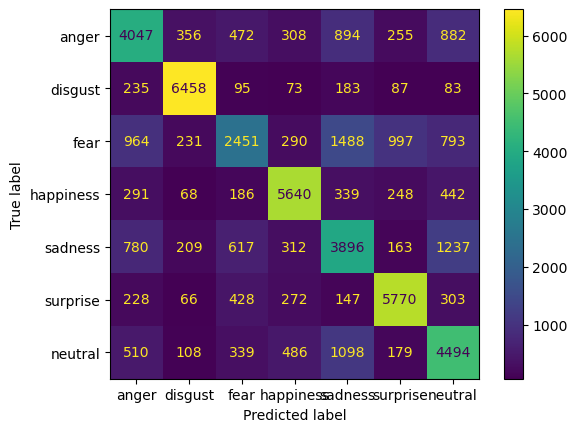

In [48]:
# Confusion matrix
ConfusionMatrixDisplay(confusion_matrix(history_train[-1]['labels'], history_train[-1]['outputs']), display_labels=emotions).plot() # Training

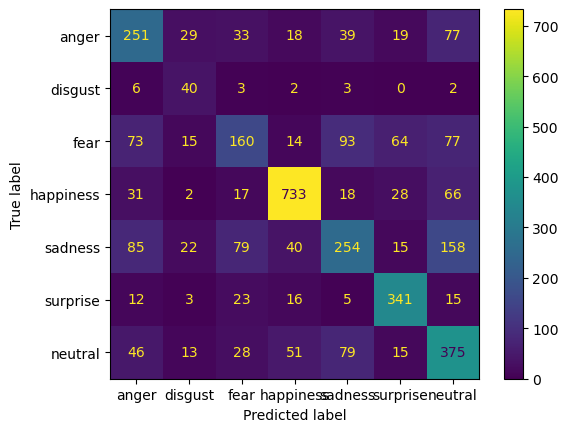

In [49]:
ConfusionMatrixDisplay(confusion_matrix(history_val[-1]['labels'], history_val[-1]['outputs']), display_labels=emotions).plot() # Validation

Test accuracy: 61.49%
Test precision (macro): 55.93%
Test recall (macro): 62.24%
Test f1: 57.57%


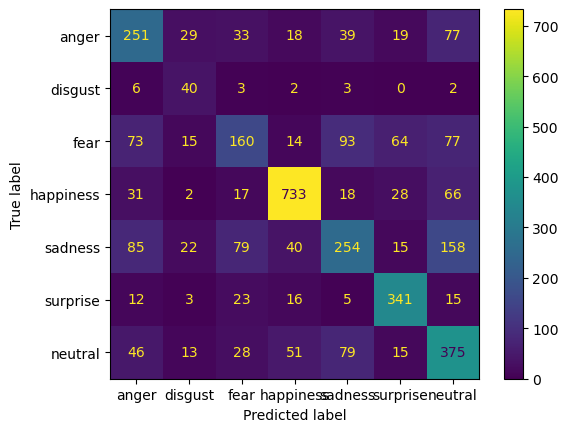

In [50]:
# Test (performed on priv_test set)
test_metrics = {'labels': [], 'outputs': [], 'n_samples': len(pub_test)}

for i, data in enumerate(priv_test_dl, 0):
    inputs, labels = data
    inputs = inputs.to(device)
    labels = labels.to(device)

    outputs = net(inputs.float())
    outputs_idx = outputs.argmax(axis=1)

    test_metrics['labels'] += labels.tolist()
    test_metrics['outputs'] += outputs_idx.tolist()

print('Test accuracy: {acc:.2f}%'.format(acc=accuracy_score(test_metrics['labels'], test_metrics['outputs'])*100))
print('Test precision (macro): {acc:.2f}%'.format(acc=precision_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
print('Test recall (macro): {acc:.2f}%'.format(acc=recall_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
print('Test f1: {acc:.2f}%'.format(acc=f1_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
ConfusionMatrixDisplay(confusion_matrix(history_val[-1]['labels'], history_val[-1]['outputs']), display_labels=emotions).plot() # Test

In [51]:
# Metrics save

exp_path = './out/'
os.makedirs(exp_path)
history_metrics.to_csv(exp_path + 'history_metrics.csv')
history_loss.to_csv(exp_path + 'history_loss.csv')

history_full = pd.concat([pd.DataFrame(history_val).assign(type='Validation'), pd.DataFrame(history_train).assign(type='Training')])
history_full.to_csv(exp_path + 'history_full.csv', header=True)

In [58]:
import torchvision.transforms as T
import matplotlib.image as mpimg

In [289]:
def emotionRecognition(image):
    #transforming image to fit the model
    img = mpimg.imread(image)
    img = torch.from_numpy(img.copy())
    transforms = torch.nn.Sequential(
        T.Resize((48,48)),
        T.Grayscale(num_output_channels=1)
    )
    img = transforms(img.permute(2,0,1))/255
    #predicting emotion
    output = net(img.type(torch.FloatTensor).unsqueeze(dim=0).to(device))
    label = int(torch.argmax(output))
    label_emotion = {i: emotions[i] for i in np.arange(7)}
    print(label_emotion[label])
    plt.imshow(img.squeeze(), cmap='gray')
    plt.show()

In [290]:
image1 = 'Riya_pic.jpg'
image2 = 'Kshitij_pic.jpeg'
image3 = 'Aryan_pic.jpg'

sadness


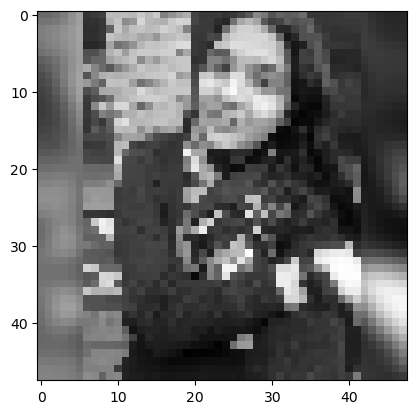

In [291]:
emotionRecognition(image1)

anger


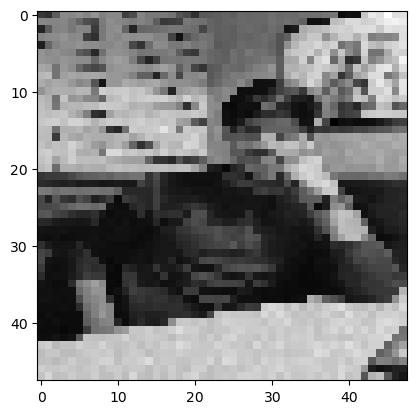

In [292]:
emotionRecognition(image2)

anger


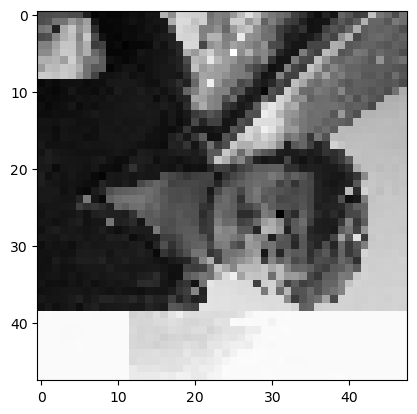

In [293]:
emotionRecognition(image3)

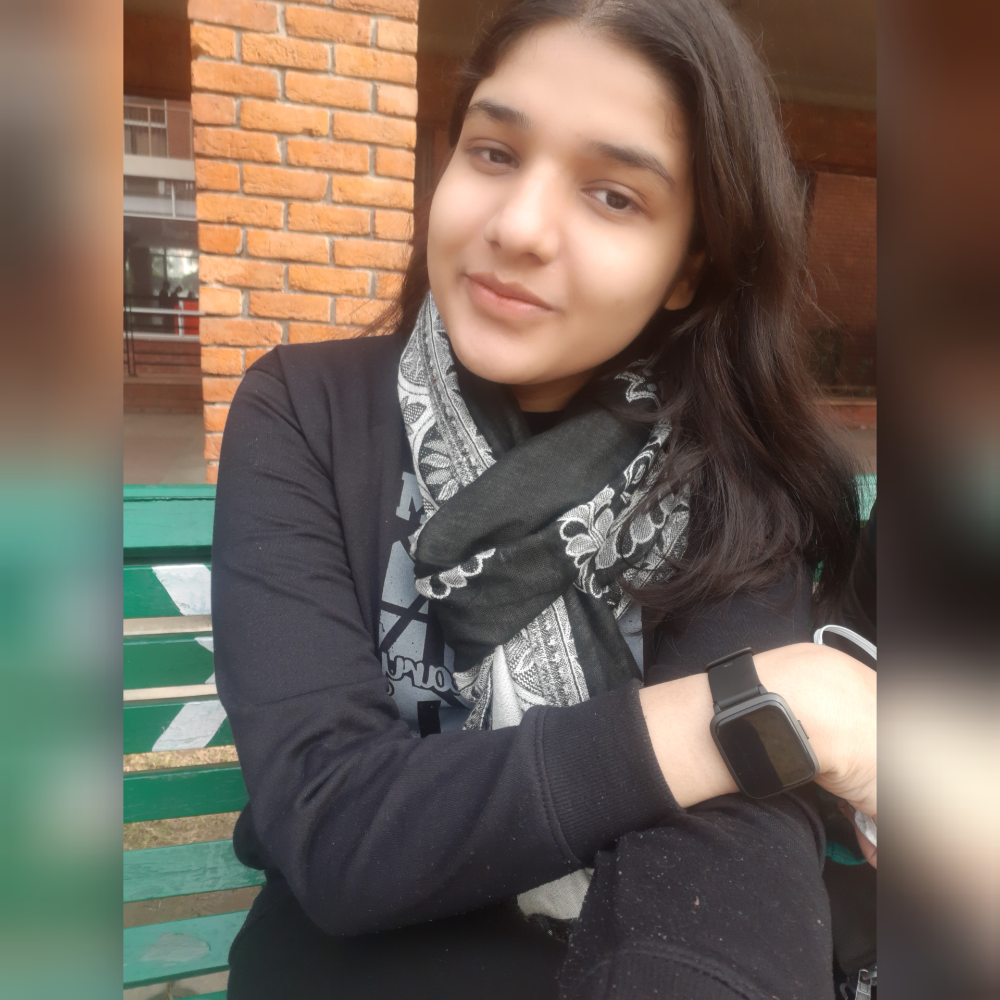

In [245]:
from IPython.display import Image
Image(filename='Riya_pic.jpg', width=200, height=200)

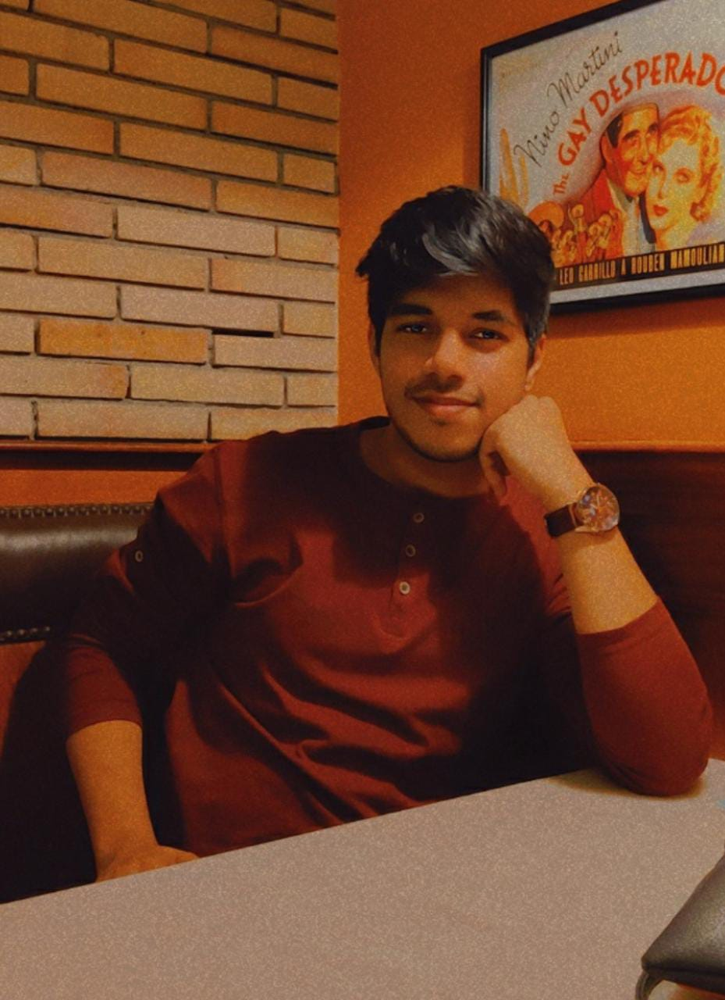

In [243]:
Image(filename='Kshitij_pic.jpeg', width=200, height=200)

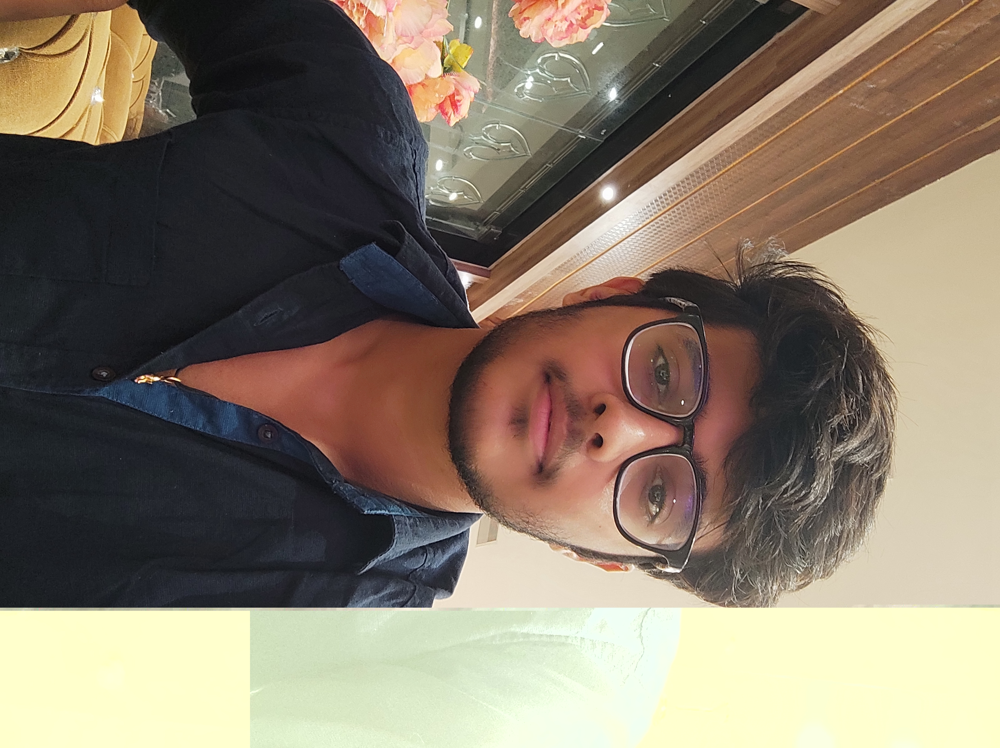

In [247]:
Image(filename='Aryan_pic.jpg', width=200, height=200)

In [66]:
## live face detection

In [96]:
# Create an instance of the model class
emotion_model = BasicConvNet()
emotion_model.to(device)

# Load the state dictionary into the model
emotion_model.load_state_dict(torch.load('best_emotion_model.pth'))

<All keys matched successfully>

In [86]:
# Load the pre-trained emotion recognition model
emotion_model = torch.load('best_emotion_model.pth')
# emotion_model.eval()
# emotion_model.to(device)

In [97]:
type(emotion_model)

__main__.BasicConvNet

In [98]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [99]:
import cv2

In [282]:
# Define the video capture object
cap = cv2.VideoCapture(0)

while True:
    # Capture frame-by-frame
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the grayscale frame
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    # Iterate over each face detected
    for (x, y, w, h) in faces:
        # Extract the face ROI and preprocess it for emotion recognition
        face_roi = gray[y:y+h, x:x+w]
        face_roi = cv2.resize(face_roi, (48, 48), interpolation=cv2.INTER_AREA)
        face_roi = np.reshape(face_roi, (1, 48, 48))
        face_roi = face_roi.astype('float32') / 255.0

        # Predict the emotion using the pre-trained emotion recognition model
        face_roi_tensor = torch.from_numpy(face_roi).unsqueeze(dim=1).to(device)
        emotion_probabilities = emotion_model(face_roi_tensor)
#         emotion_probabilities = emotion_model(face_roi.unsqueeze(dim=0).to(device))
#         emotion_label_arg = np.argmax(emotion_probabilities.cpu())
        emotion_label_arg = np.argmax(emotion_probabilities.detach().cpu().numpy())
        emotion_label = emotions[emotion_label_arg]

        # Draw a rectangle around the face and display the predicted emotion label
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(frame, emotion_label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2, cv2.LINE_AA)

    # Display the resulting frame
    cv2.imshow('Facial Emotion Recognition', frame)

    # Exit the program on 'q' key press
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break


In [283]:
# Release the video capture object and close all windows
cap.release()
cv2.destroyAllWindows()

In [285]:
emotion_label

'neutral'

In [118]:
import spotipy.oauth2 as oauth2
from spotipy.oauth2 import SpotifyOAuth
import time

In [204]:
import spotipy.util as util
import webbrowser

In [298]:
# Code for fetching playlist
music_dict = {"anger":"https://open.spotify.com/playlist/1A56AAn2vVz0PWxIiD5Skp",
              "disgust":"https://open.spotify.com/playlist/4hP5ljHW37PwMSY4Vvc2Di",
              "fear":"https://open.spotify.com/playlist/07MfZTE8JCVlV2d2HxgEai",
              "happiness":"https://open.spotify.com/playlist/0GQdL48pDR6u1JCVhSTUfS",
              "sadness":"https://open.spotify.com/playlist/4i62GVkkFrdgWEdOvUZzlJ",
              "surprise":"https://open.spotify.com/playlist/6jAre1D5ND1eF7k8tmgTE1",
              "neutral":"https://open.spotify.com/playlist/6yHHsjJVXsi9NuFlnmUQDW"
}

In [309]:
def get_emotion(label):
    if isinstance(label, int) and label >= 0 and label <= 6:
        return emotions[label]
    elif isinstance(label, str):
        return label
    else:
        return None

In [353]:
def playMusic(label):
    redirect_uri = "https://localhost:8080"
    scope = 'user-read-playback-state, user-modify-playback-state'
    
    playlist_uri = music_dict[get_emotion(label)]
    token = util.prompt_for_user_token(username, scope, client_id, client_secret, redirect_uri)
    if token:
        #create spotify client object
        sp = spotipy.Spotify(auth=token)
        
        #open playlist and start playback
        sp.start_playback(device_id=spotify_device_id, context_uri=playlist_uri)
        
        #open spotify app
        webbrowser.open('https://open.spotify.com')
    else:
        print("Can't fet token for: ", username)

In [354]:
playMusic(emotion_label)

In [174]:
import requests
import json

In [318]:
import os

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

ccm = SpotifyClientCredentials(client_id = '8273a2c901fa4c01872e6a6e566aa5fc', client_secret = 'bee18c40bd7f4e1cb9a60f4fdf64c00b')
sp = spotipy.Spotify(client_credentials_manager = ccm)

os.environ["SPOTIPY_CLIENT_ID"] = '8273a2c901fa4c01872e6a6e566aa5fc'
os.environ["SPOTIPY_CLIENT_SECRET"] = 'bee18c40bd7f4e1cb9a60f4fdf64c00b'
os.environ["SPOTIPY_REDIRECT_URI"] = "https://localhost:8080"

scope = 'user-library-read'
username = "Devil"

token = spotipy.util.prompt_for_user_token(username, scope)

if token:
    spotipy_obj = spotipy.Spotify(auth=token)
    saved_tracks_resp = spotipy_obj.current_user_saved_tracks(limit=50)
else:
    print('Couldn\'t get token for that username')

Enter the URL you were redirected to: https://localhost:8080/?code=AQCGO4MxrSzaAnFnfjKKbz_J105spSpo3g8k2SXN07XbZjAVN4tru6ZflYItVTV61kHKmmzRdpknPpATytCtjkWUraq8uVOYgix4Io1nJQBQSDDkcW2W9GZV9nYeJyP3n5icY2_8BkWuSAW1W0Tdw3cTrRhRdl2CNgca_7EabV0EWaIMNA0jsYiBo855


In [321]:
import base64
import requests

client_id = '8273a2c901fa4c01872e6a6e566aa5fc'
client_secret = 'bee18c40bd7f4e1cb9a60f4fdf64c00b'

auth_url = 'https://accounts.spotify.com/api/token'
auth_header = base64.b64encode(f"{client_id}:{client_secret}".encode('ISO-8859-1')).decode('ascii')
auth_payload = {'grant_type': 'client_credentials'}

auth_response = requests.post(auth_url, headers={'Authorization': f'Basic {auth_header}'}, data=auth_payload)
if auth_response.status_code == 200:
    token = auth_response.json()['access_token']
    print(token)

BQD5pxzLuFhjDJDtWHeCPI8c-4CM1gX6J2ZQgSS8pCKSs5QRK0jXdUzKv9mDeI3pNypG4Lq13ANNAfFB-wfskF2dJFRmdg4yjyuW47saQf0avqdOvOZf


In [322]:
token

'BQD5pxzLuFhjDJDtWHeCPI8c-4CM1gX6J2ZQgSS8pCKSs5QRK0jXdUzKv9mDeI3pNypG4Lq13ANNAfFB-wfskF2dJFRmdg4yjyuW47saQf0avqdOvOZf'

In [351]:
devices = sp.devices()
print(devices)

{'devices': [{'id': '3e30fbf35d83f8a0edcbf9a74e8e018af9a081fa', 'is_active': True, 'is_private_session': False, 'is_restricted': False, 'name': 'Web Player (Chrome)', 'type': 'Computer', 'volume_percent': 100}]}


In [352]:
spotify_device_id = devices['devices'][0]['id']
print(spotify_device_id)

3e30fbf35d83f8a0edcbf9a74e8e018af9a081fa
